In [50]:
import pandas as pd 
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import metrics
import matplotlib.pyplot as plt
import matplotlib.cm as cm 
import numpy as np

In [6]:
# Load in preprocessed data
pca_df = pd.read_csv('preprocessed_movie_data.csv')

In [7]:
pca_df.head()

,Unnamed: 0,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,Kate & Leopold (2001),0.896061,2.279608,0.887411,-1.246331,0.845740,-0.782039,0.156796
1,The Sorcerer's Apprentice (2010),0.937418,0.225093,-3.434508,-0.949285,0.888324,-0.876352,0.719884
2,Fantastic Four (2005),3.927429,0.948364,-0.943775,-1.442382,0.598895,-0.506675,0.970831
3,Fantastic Four (2015),1.845119,-0.214946,-0.802197,0.164656,0.122854,-0.055949,1.915743
4,Frida (2002),0.516794,1.079201,1.872714,-1.309653,0.254311,-0.430248,-0.062360


In [14]:
X = pca_df.drop('Unnamed: 0', axis=1)
y = pca_df['Unnamed: 0']

In [52]:
X

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,0.896061,2.279608,0.887411,-1.246331,0.845740,-0.782039,0.156796
1,0.937418,0.225093,-3.434508,-0.949285,0.888324,-0.876352,0.719884
2,3.927429,0.948364,-0.943775,-1.442382,0.598895,-0.506675,0.970831
3,1.845119,-0.214946,-0.802197,0.164656,0.122854,-0.055949,1.915743
4,0.516794,1.079201,1.872714,-1.309653,0.254311,-0.430248,-0.062360
...,...,...,...,...,...,...,...
9309,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601
9310,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601
9311,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601
9312,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601


In [ ]:
# Starting with 3 clusters
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)


KMeans(n_clusters=5)

In [48]:
# Joining the labels with the original Dataframe
pd.concat([pd.DataFrame(kmeans.labels_).reset_index(),X.reset_index()],axis=1).drop('index',axis=1)

,0,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,3,0.896061,2.279608,0.887411,-1.246331,0.845740,-0.782039,0.156796
1,1,0.937418,0.225093,-3.434508,-0.949285,0.888324,-0.876352,0.719884
2,4,3.927429,0.948364,-0.943775,-1.442382,0.598895,-0.506675,0.970831
3,4,1.845119,-0.214946,-0.802197,0.164656,0.122854,-0.055949,1.915743
4,1,0.516794,1.079201,1.872714,-1.309653,0.254311,-0.430248,-0.062360
...,...,...,...,...,...,...,...,...
9309,1,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601
9310,1,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601
9311,1,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601
9312,1,-0.480956,0.094310,0.119247,0.016329,-0.125769,-0.393238,-0.219601


In [49]:
metrics.silhouette_score(X,kmeans.labels_)

np.float64(0.5040114837925268)

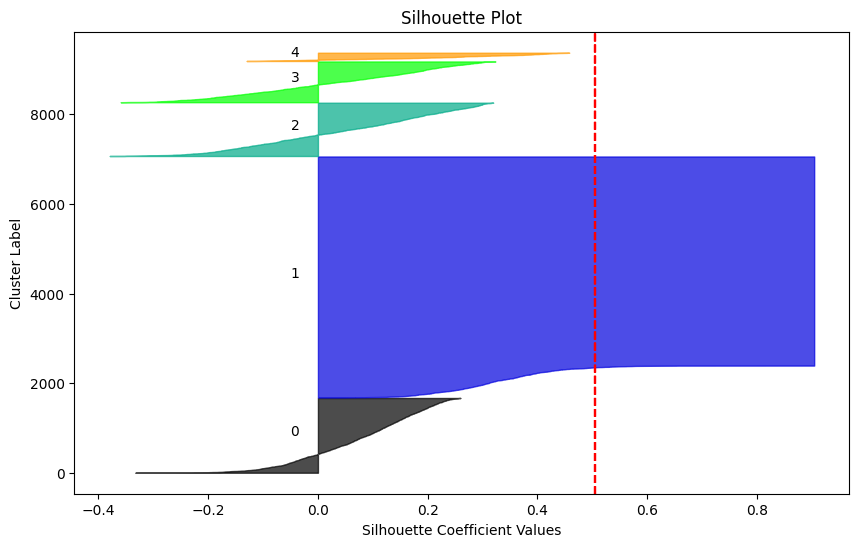

In [80]:
kmeans = KMeans(n_clusters=5, random_state=42)
# Fits the KMeans model on the transformed PCA data, predicts the cluster labels for each data point
kmeans_labels = kmeans.fit_predict(X)

fig, ax = plt.subplots(figsize=(10,6))
silhouette_avg = silhouette_score(X, kmeans_labels)
sample_silhouette_values = silhouette_samples(X, kmeans_labels)
y_lower = 10


for i in range(5):
    cluster_silhouette_values = sample_silhouette_values [kmeans_labels == i]
    cluster_silhouette_values.sort()
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size

    color = plt.cm.nipy_spectral(float(i) / 5)
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    y_lower = y_upper + 10


ax.set_title("Silhouette Plot")
ax.set_xlabel("Silhouette Coefficient Values")
ax.set_ylabel("Cluster Label")
plt.show ()

In [77]:
n_clusters = 6
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X)

# Compute the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(X, cluster_labels)
silhouette_avg = silhouette_score(X, cluster_labels)

print(f"Average Silhouette Score for n_clusters = {n_clusters}: {silhouette_avg:.3f}")

# Start plotting the silhouette
plt.figure()
y_lower = 10

for i in range(n_clusters):
    # Aggregate the silhouette scores for samples in cluster i
    ith_cluster_sil_values = sample_silhouette_values[cluster_labels == i]
    
    # Sort the silhouette values
    ith_cluster_sil_values.sort()
    
    size_cluster_i = ith_cluster_sil_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    # Fill the area for each cluster
    plt.fill_between(
        np.arange(y_lower, y_upper),
        0,
        ith_cluster_sil_values
    )
    
    # Label the silhouette plots with their cluster numbers
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
    # Move to the next segment
    y_lower = y_upper + 10  # 10 for spacing between plots

plt.title(f"Silhouette Analysis (n_clusters = {n_clusters})")
plt.xlabel("Silhouette Coefficient Values")
plt.ylabel("Cluster Label")

# The vertical line for average silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--")

# plt.yticks([])  # Clear the y-axis labels
plt.show()

Average Silhouette Score for n_clusters = 6: 0.517


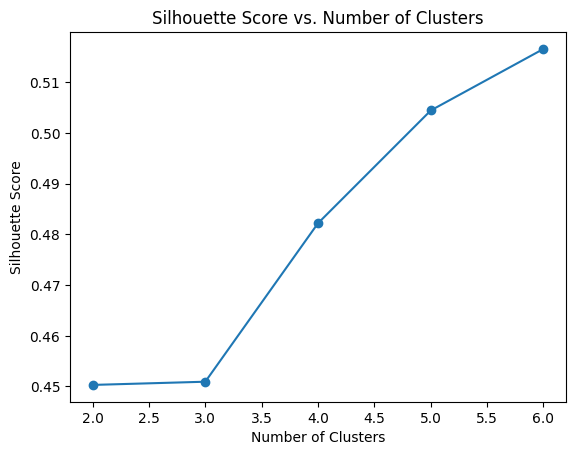

In [82]:
range_n_clusters = list(range (2,7))
silhouette_scores_list = []
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, kmeans_labels)
    silhouette_scores_list.append(silhouette_avg)

plt.figure()
plt.plot(range_n_clusters, silhouette_scores_list, marker='o')
plt.xlabel('Number of Clusters') 
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.show()

In [83]:
optimal_clusters = range_n_clusters[silhouette_scores_list.index(max(silhouette_scores_list))]
print("Optimal Number of Clusters:", optimal_clusters)

Optimal Number of Clusters: 6


In [76]:
def silhouette_analysis_kmeans(X, range_n_clusters=(2, 3, 4, 5, 6, 7)):
    """
    For each number of clusters in range_n_clusters, this function:
    1. Performs KMeans clustering on X.
    2. Plots the silhouette scores for each cluster (left subplot).
    3. Plots the clustered data in the 2D feature space (right subplot).
    """
    
    for n_clusters in range_n_clusters:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
        
        # Step 1: Run KMeans
        clusterer = KMeans(n_clusters=n_clusters, 
                           n_init="auto", 
                           random_state=42)
        cluster_labels = clusterer.fit_predict(X)
        
        # Step 2: Compute silhouette score
        silhouette_avg = silhouette_score(X, cluster_labels)
        print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg:.3f}")
        
        # Step 3: Compute silhouette scores per sample
        sample_sil_values = silhouette_samples(X, cluster_labels)
        
        # ----- Left plot: silhouette scores -----
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters + 1) * 10 is for space between silhouette plots
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
        
        y_lower = 10
        for i in range(n_clusters):
            # Select and sort silhouette values for cluster i
            ith_cluster_vals = sample_sil_values[cluster_labels == i]
            ith_cluster_vals.sort()
            
            size_cluster_i = ith_cluster_vals.shape[0]
            y_upper = y_lower + size_cluster_i
            
            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_vals,
                facecolor=color, 
                edgecolor=color, 
                alpha=0.7
            )
            
            # Label the silhouette plot with cluster numbers
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            
            y_lower = y_upper + 10
        
        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")
        # Average silhouette score vertical line
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])
        ax1.set_xticks(np.linspace(-0.1, 1, 12))
        
        # ----- Right plot: cluster visualization in feature space -----
        # (Here we just use the first 2 columns of X for a 2D scatter plot)
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], 
                    marker='.', s=30, lw=0, 
                    alpha=0.7, c=colors, edgecolor='k')
        
        # Mark the cluster centers
        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 0], centers[:, 1], 
                    marker='o', c="white", alpha=1, 
                    s=200, edgecolor='k')
        
        # Label each center with the cluster number
        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], 
                        marker=f'${i}$', alpha=1,
                        s=50, edgecolor='k')
        
        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")
        
        # Main title
        plt.suptitle((f"Silhouette analysis for KMeans clustering on sample data "
                      f"with n_clusters = {n_clusters}"),
                     fontsize=14, fontweight='bold')
        
        plt.show()

For n_clusters = 2, the average silhouette_score is : 0.450


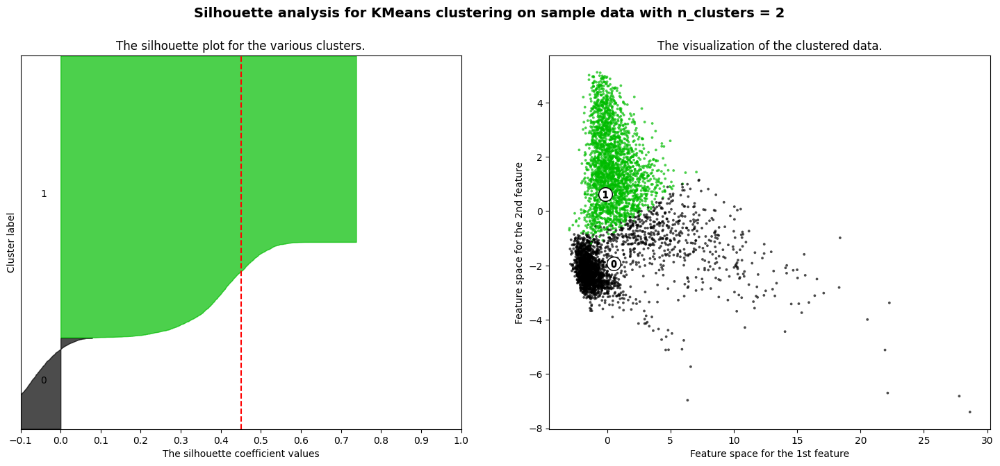

For n_clusters = 3, the average silhouette_score is : 0.451


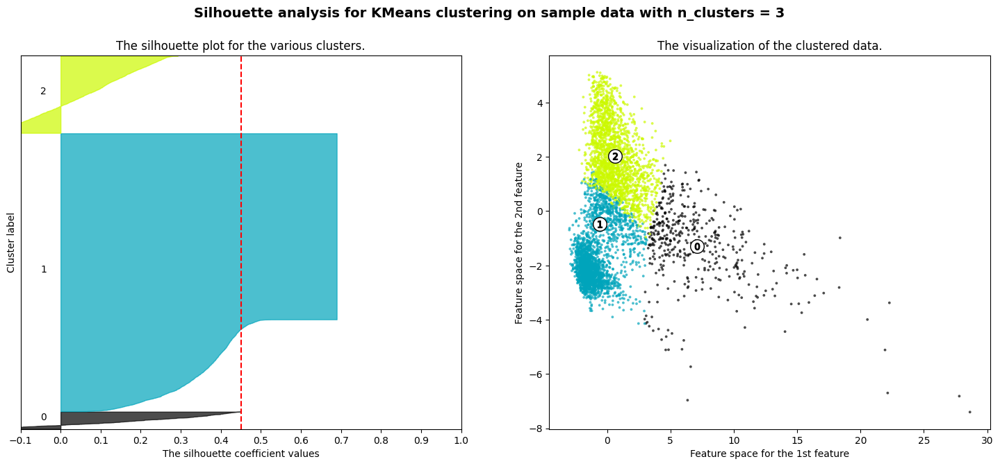

For n_clusters = 4, the average silhouette_score is : 0.482


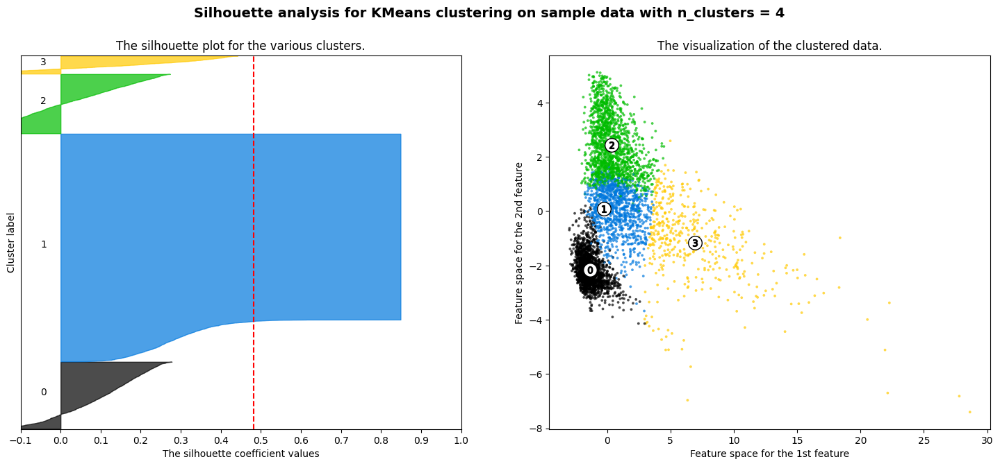

For n_clusters = 5, the average silhouette_score is : 0.504


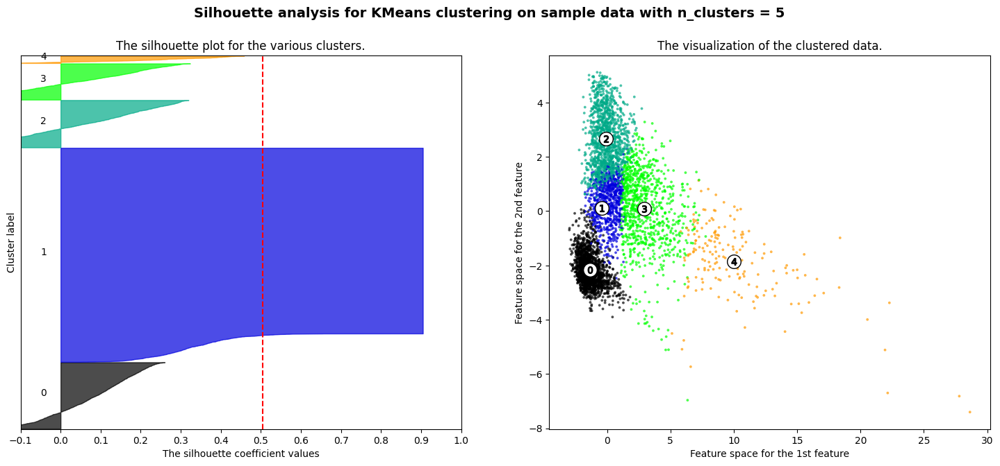

For n_clusters = 6, the average silhouette_score is : 0.517


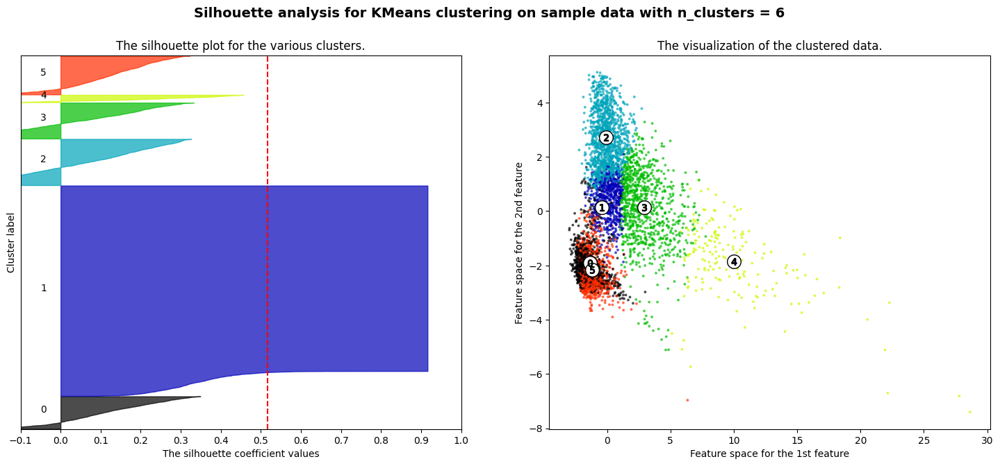

In [71]:
silhouette_analysis_kmeans(X,range_n_clusters=(2, 3, 4, 5, 6))

0       2.279608
1       0.225093
2       0.948364
3      -0.214946
4       1.079201
          ...   
9309    0.094310
9310    0.094310
9311    0.094310
9312    0.094310
9313    0.094310
Name: PC2, Length: 9314, dtype: float64